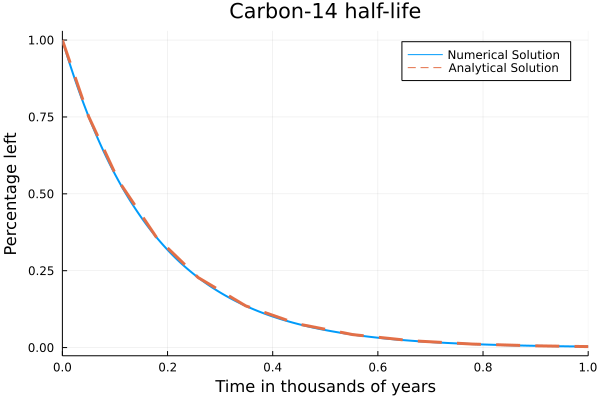

In [1]:
using OrdinaryDiffEq, Plots
gr()

#Half-life of Carbon-14 is 5,730 years.
C₁ = 5.730

#Setup
u₀ = 1.0
tspan = (0.0, 1.0)

#Define the problem
radioactivedecay(u,p,t) = -C₁*u

#Pass to solver
prob = ODEProblem(radioactivedecay,u₀,tspan)
sol = solve(prob,Tsit5())

#Plot
plot(sol,linewidth=2,title ="Carbon-14 half-life", xaxis = "Time in thousands of years", yaxis = "Percentage left", label = "Numerical Solution")
plot!(sol.t, t->exp(-C₁*t),lw=3,ls=:dash,label="Analytical Solution")

┌ Warning: To maintain consistency with solution indexing, keyword argument vars will be removed in a future version. Please use keyword argument idxs instead.
│   caller = ip:0x0
└ @ Core :-1


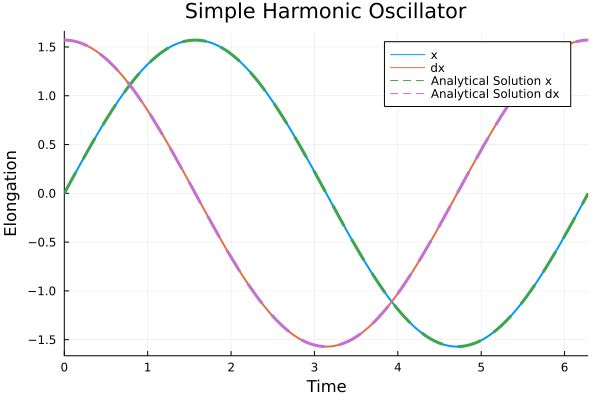

In [2]:
#Parameters
ω = 1

#Initial Conditions
x₀ = [0.0]
dx₀ = [π/2]
tspan = (0.0, 2π)

ϕ = atan((dx₀[1]/ω)/x₀[1])
A = √(x₀[1]^2 + dx₀[1]^2)

#Define the problem
function harmonicoscillator(ddu,du,u,ω,t)
    ddu .= -ω^2 * u
end

#Pass to solvers
prob = SecondOrderODEProblem(harmonicoscillator, dx₀, x₀, tspan, ω)
sol = solve(prob, DPRKN6())

#Plot
plot(sol, vars=[2,1], linewidth=2, title ="Simple Harmonic Oscillator", xaxis = "Time", yaxis = "Elongation", label = ["x" "dx"])
plot!(t->A*cos(ω*t-ϕ), lw=3, ls=:dash, label="Analytical Solution x")
plot!(t->-A*ω*sin(ω*t-ϕ), lw=3, ls=:dash, label="Analytical Solution dx")

┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots /home/ianch/.julia/packages/Plots/SkUg1/src/axes.jl:596
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots /home/ianch/.julia/packages/Plots/SkUg1/src/axes.jl:596
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots /home/ianch/.julia/packages/Plots/SkUg1/src/axes.jl:596
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots /home/ianch/.julia/packages/Plots/SkUg1/src/axes.jl:596
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots /home/ianch/.julia/packages/Plots/SkUg1/src/axes.jl:596
┌ Warning: Invalid limits for 

┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots /home/ianch/.julia/packages/Plots/SkUg1/src/axes.jl:596
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots /home/ianch/.julia/packages/Plots/SkUg1/src/axes.jl:596
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots /home/ianch/.julia/packages/Plots/SkUg1/src/axes.jl:596
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots /home/ianch/.julia/packages/Plots/SkUg1/src/axes.jl:596
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots /home/ianch/.julia/packages/Plots/SkUg1/src/axes.jl:596
┌ Warning: Invalid limits for 

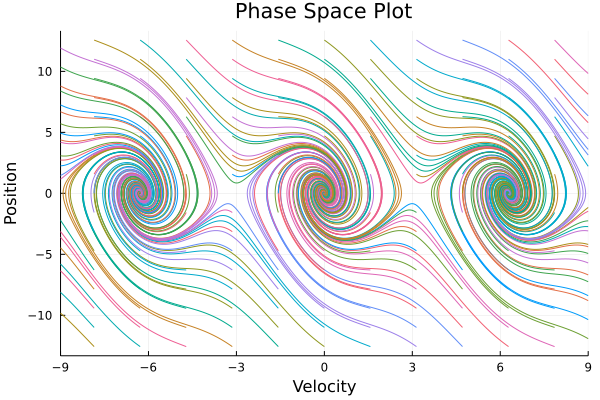

┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots /home/ianch/.julia/packages/Plots/SkUg1/src/axes.jl:596
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots /home/ianch/.julia/packages/Plots/SkUg1/src/axes.jl:596
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots /home/ianch/.julia/packages/Plots/SkUg1/src/axes.jl:596
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots /home/ianch/.julia/packages/Plots/SkUg1/src/axes.jl:596
┌ Warning: Invalid limits for y axis. Limits should be a symbol, or a two-element tuple or vector of numbers.
│ ylims = nothing
└ @ Plots /home/ianch/.julia/packages/Plots/SkUg1/src/axes.jl:596
┌ Warning: Invalid limits for 

In [19]:
# Simple Pendulum Problem
using OrdinaryDiffEq, Plots

#Constants
const g = 9.81
L = 1.0
s = -1.7

#Initial Conditions
u₀ = [0,π/2]
tspan = (0.0,6.3)

#Define the problem
function simplependulum(du,u,p,t)
    θ = u[1]
    dθ = u[2]
    du[1] = dθ
    du[2] = -(g/L)*sin(θ) + s*dθ
end

#Pass to solvers
prob = ODEProblem(simplependulum, u₀, tspan)
sol = solve(prob,Tsit5())

#Plot
plot(sol,linewidth=2,title ="Simple Pendulum Problem", xaxis = "Time", yaxis = "Height", label = ["\\theta" "d\\theta"])

p = plot(sol,vars = (1,2), xlims = (-9,9), title = "Phase Space Plot", xaxis = "Velocity", yaxis = "Position", leg=false)
function phase_plot(prob, u0, p, tspan=2pi)
    _prob = ODEProblem(prob.f,u0,(0.0,tspan))
    sol = solve(_prob,Vern9()) # Use Vern9 solver for higher accuracy
    plot!(p,sol,vars = (1,2), xlims = nothing, ylims = nothing)
end
for i in -4pi:pi/2:4π
    for j in -4pi:pi/2:4π
        phase_plot(prob, [j,i], p)
    end
end
plot(p,xlims = (-9,9))